# Confounding Diving48
In this notebook we'll implement a version of the Diving48 dataset that contains spurious correlations on specific classes.
These spurious correlations will be colored 12x12 boxes at a specific location for each class.

We will pick $n$ random classes and place 12x12 red box at a specific spatial location of the video - meaning each video frame
will have the same colored box at the same $x, y$ coordinates. Essentially the function $C(x_i, x_y) = \hat{x_i}$, takes in a class label $y_i$, and a sample $x_i$, such that $\hat{x_i}$ has a colored box in non-overlapping location compared to other, conditioned on $y_i \ne y_j$.

In [1]:
%load_ext autoreload
%autoreload 2

import diveslowlearnfast as dlf

from diveslowlearnfast.datasets import Diving48Dataset, Diving48ConfounderDatasetWrapper
from diveslowlearnfast.config import Config

from torchvision.transforms.v2 import Compose

## Input Preparation
Let's first prepare our input by loading the Diving48 dataset.

In [2]:
cfg = Config()
cfg.DATA.DATASET_PATH = '/Users/youritomassen/Projects/xai/data/Diving48/'
cfg.DATA.NUM_FRAMES = 4
diving48 = Diving48Dataset(
    cfg.DATA.DATASET_PATH,
    cfg.DATA.NUM_FRAMES,
    cfg.SLOWFAST.ALPHA,
    transform_fn=dlf.get_test_transform(cfg)
)

In [3]:
video_idx = 2048
x_i, y_i, *_ = diving48.__getitem__(video_idx)

x_i = dlf.tensor_denorm(x_i, cfg.DATA.MEAN, cfg.DATA.STD, permute_channel=False)
x_i = dlf.tensor_min_max_norm(x_i)
x_i.shape, diving48.get_label(y_i)

(torch.Size([3, 4, 256, 256]), ['Back', '25som', 'NoTwis', 'PIKE'])

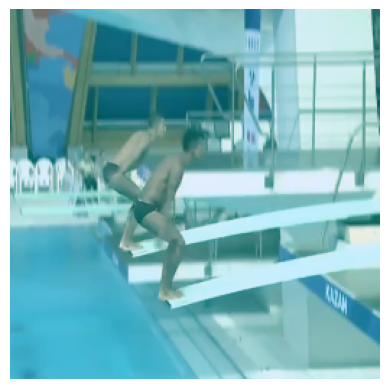

In [4]:
frame_idx = 2
dlf.frameshow(x_i, 0)

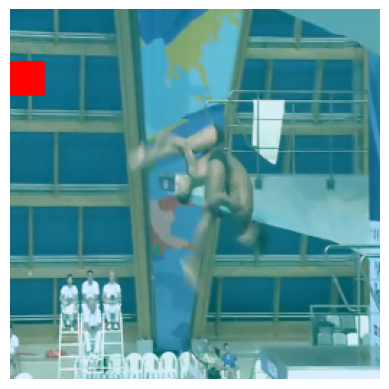

In [5]:
hat_x_i = dlf.superimpose_confounder(x_i, y_i)
dlf.frameshow(hat_x_i, 1)

In [27]:
diving48 = Diving48Dataset(
    cfg.DATA.DATASET_PATH,
    cfg.DATA.NUM_FRAMES,
    cfg.SLOWFAST.ALPHA,
    transform_fn=dlf.get_test_transform(cfg)
)

diving48_confounder = Diving48ConfounderDatasetWrapper(diving48, cfg)

[autoreload of diveslowlearnfast.config.defaults failed: Traceback (most recent call last):
  File "/Users/youritomassen/Projects/Uni/Master Thesis/diveslowlearnfast/.venv/lib/python3.12/site-packages/IPython/extensions/autoreload.py", line 276, in check
    superreload(m, reload, self.old_objects)
  File "/Users/youritomassen/Projects/Uni/Master Thesis/diveslowlearnfast/.venv/lib/python3.12/site-packages/IPython/extensions/autoreload.py", line 500, in superreload
    update_generic(old_obj, new_obj)
  File "/Users/youritomassen/Projects/Uni/Master Thesis/diveslowlearnfast/.venv/lib/python3.12/site-packages/IPython/extensions/autoreload.py", line 397, in update_generic
    update(a, b)
  File "/Users/youritomassen/Projects/Uni/Master Thesis/diveslowlearnfast/.venv/lib/python3.12/site-packages/IPython/extensions/autoreload.py", line 349, in update_class
    if update_generic(old_obj, new_obj):
       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/youritomassen/Projects/Uni/Master Thesi

AttributeError: 'Config' object has no attribute 'CONFOUNDERS'

In [25]:
video_idx = 10_009
x_i, y_i, *_ = diving48_confounder[video_idx]

x_i = dlf.tensor_denorm(x_i, cfg.DATA.MEAN, cfg.DATA.STD, permute_channel=False)
x_i = dlf.tensor_min_max_norm(x_i)
x_i.shape, diving48.get_label(y_i)

(torch.Size([3, 4, 256, 256]), ['Inward', '25som', 'NoTwis', 'PIKE'])

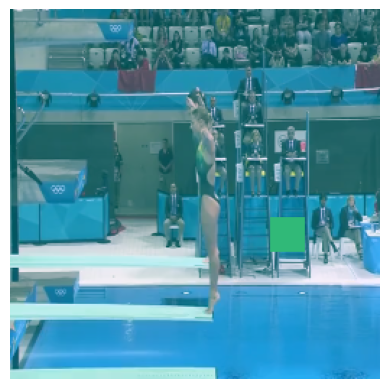

In [26]:
dlf.frameshow(x_i, 0)

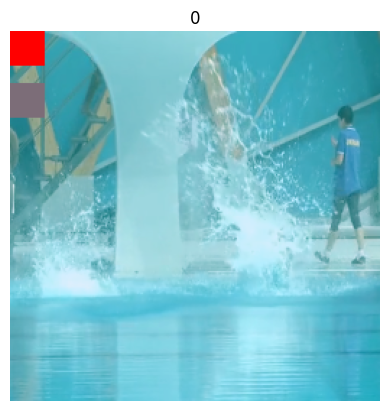

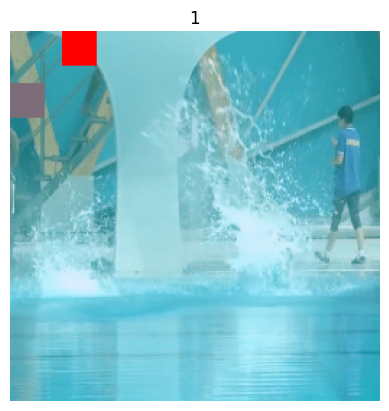

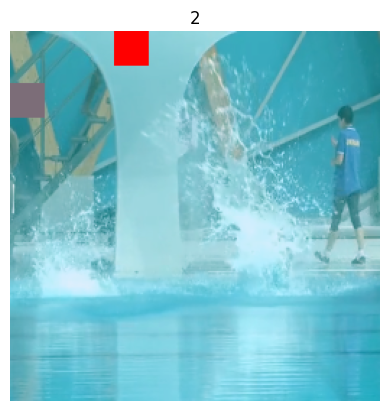

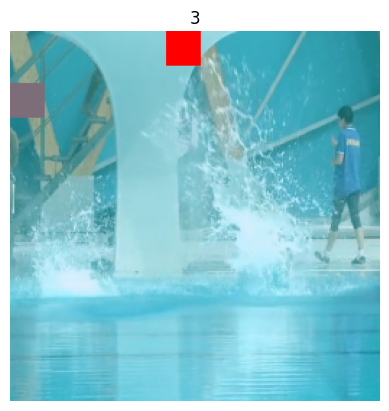

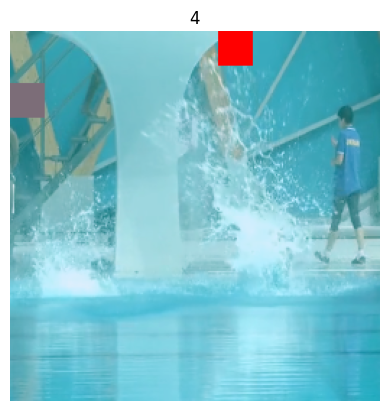

...

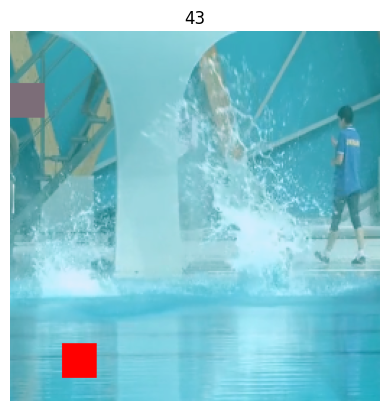

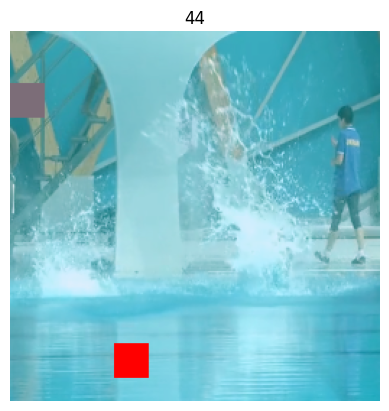

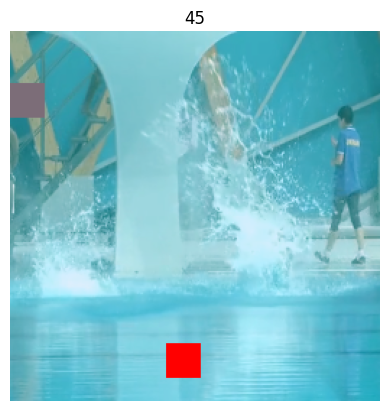

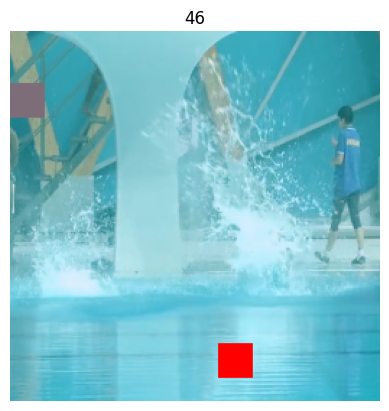

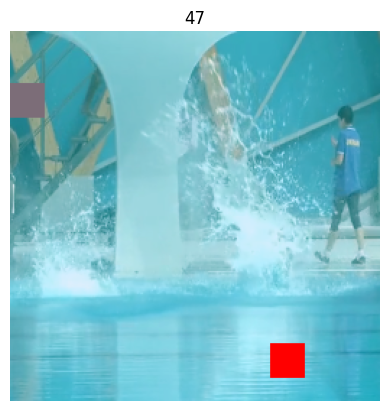

In [13]:
for class_id in range(48):
    hat_x_i = dlf.superimpose_confounder(x_i, class_id)
    dlf.frameshow(hat_x_i, 3, title=class_id)